# Neural Style Transfer
Neural Style Transfer, an algorithm created by Gatys et al (https://arxiv.org/abs/1508.06576) is a technique in machine learning that allows you to take two images—a content image (the image you want to transform) and a style image (the image whose artistic style you want to apply)—and blend them together to create a new, stylized version of the content image.

In [89]:
import os
import sys
import scipy.io
import scipy.misc
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
from PIL import Image
import numpy as np
import tensorflow as tf
import pprint
%matplotlib inline

In [90]:
tf.random.set_seed(42)
img_size = 200
vgg = tf.keras.applications.VGG19(include_top=False,
                                  input_shape=(img_size, img_size, 3),
                                  weights='imagenet')

for layer in vgg.layers:
    layer.trainable = False

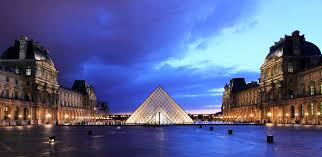

In [ ]:
content_image = Image.open("louvre.jpg")
content_image

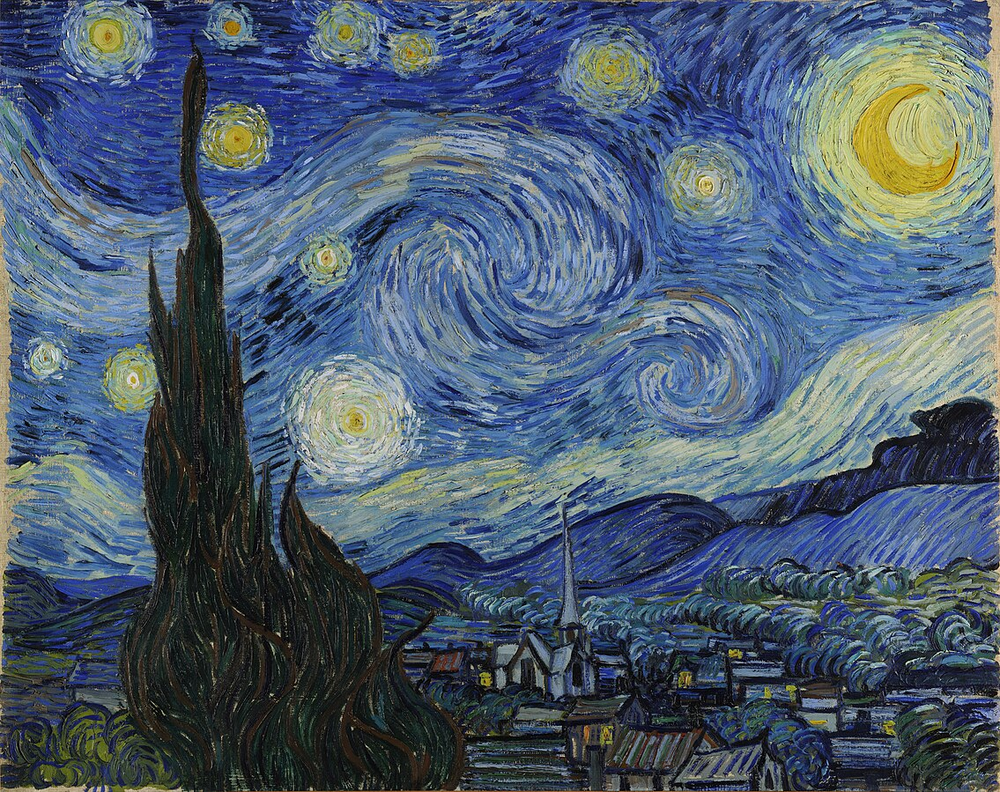

In [ ]:
style_image = Image.open("Starry_Night.jpg")
style_image

In [91]:
def compute_content_cost(content_output, generated_output):
    a_C = content_output[-1]
    a_G = generated_output[-1]

    _, n_H, n_W, n_C = a_G.get_shape().as_list()

    a_C_unrolled = tf.reshape(a_C, [n_H*n_W,n_C])
    a_G_unrolled = tf.reshape(a_G, [n_H*n_W,n_C])

    J_content = (1/(4*n_H*n_W*n_C))*(tf.reduce_sum(tf.square(tf.subtract(a_C_unrolled,a_G_unrolled))))

    return J_content

In [92]:
def gram_matrix(A):

    GA = tf.linalg.matmul(A, tf.transpose(A))

    return GA

In [93]:
def compute_layer_style_cost(a_S, a_G):

    _, n_H, n_W, n_C = a_G.get_shape().as_list()

    a_S = tf.transpose(tf.reshape(a_S,[n_H*n_W,n_C]))
    a_G = tf.transpose(tf.reshape(a_G,[n_H*n_W,n_C]))

    GS = gram_matrix(a_S)
    GG = gram_matrix(a_G)

    J_style_layer = (tf.reduce_sum(tf.square(tf.subtract(GS, GG)))) / ((2*n_C*n_H*n_W)**2)

    return J_style_layer

In [ ]:
#vgg.get_layer('block5_conv4').output

<KerasTensor shape=(None, 25, 25, 512), dtype=float32, sparse=False, name=keras_tensor_42>

In [94]:
STYLE_LAYERS = [
    ('block1_conv1', 0.2),
    ('block2_conv1', 0.2),
    ('block3_conv1', 0.2),
    ('block4_conv1', 0.2),
    ('block5_conv1', 0.2)]

In [95]:
def compute_style_cost(style_image_output, generated_image_output, STYLE_LAYERS=STYLE_LAYERS):

    J_style = 0

    a_S = style_image_output[:-1]

    a_G = generated_image_output[:-1]
    for i, weight in zip(range(len(a_S)), STYLE_LAYERS):
        J_style_layer = compute_layer_style_cost(a_S[i], a_G[i])
        J_style += weight[1] * J_style_layer

    return J_style

In [96]:
@tf.function()
def total_cost(J_content, J_style, alpha = 10, beta = 40):

    J = alpha * J_content + beta * J_style

    return J

(1, 200, 200, 3)


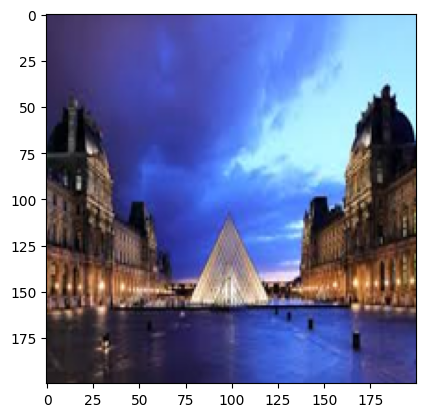

In [97]:
content_image = np.array(Image.open("louvre.jpg").resize((img_size, img_size)))
content_image = tf.constant(np.reshape(content_image, ((1,) + content_image.shape)))

print(content_image.shape)
imshow(content_image[0])
plt.show()

(1, 200, 200, 3)


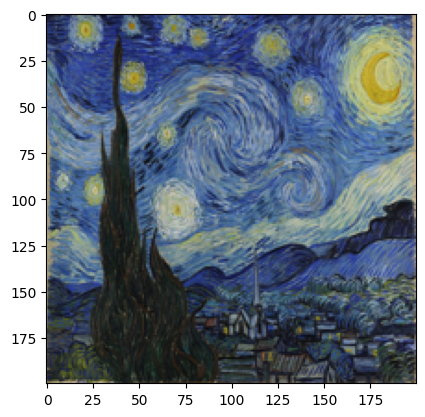

In [98]:
style_image =  np.array(Image.open("Starry_Night.jpg").resize((img_size, img_size)))
style_image = tf.constant(np.reshape(style_image, ((1,) + style_image.shape)))

print(style_image.shape)
imshow(style_image[0])
plt.show()

(1, 200, 200, 3)


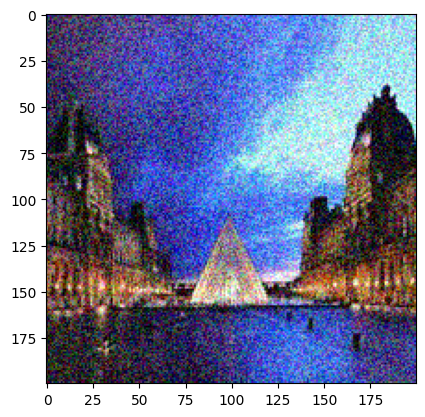

In [99]:
generated_image = tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))
noise = tf.random.uniform(tf.shape(generated_image), -0.25, 0.25)
generated_image = tf.add(generated_image, noise)
generated_image = tf.clip_by_value(generated_image, clip_value_min=0.0, clip_value_max=1.0)

print(generated_image.shape)
imshow(generated_image.numpy()[0])
plt.show()

In [103]:
def get_layer_outputs(vgg, layer_names):
    outputs = [vgg.get_layer(layer[0]).output for layer in layer_names]

    model = tf.keras.Model([vgg.input], outputs)
    return model

In [104]:
content_layer = [('block5_conv4', 1)]

vgg_model_outputs = get_layer_outputs(vgg, STYLE_LAYERS + content_layer)

In [105]:
content_target = vgg_model_outputs(content_image)
style_targets = vgg_model_outputs(style_image)

In [106]:
preprocessed_content =  tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))
a_C = vgg_model_outputs(preprocessed_content)

In [107]:
preprocessed_style =  tf.Variable(tf.image.convert_image_dtype(style_image, tf.float32))
a_S = vgg_model_outputs(preprocessed_style)

In [108]:
def clip_0_1(image):
    return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

def tensor_to_image(tensor):
    tensor = tensor * 255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor) > 3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]
    return Image.fromarray(tensor)

In [109]:
generated_image = tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))
noise = tf.random.uniform(tf.shape(generated_image), -0.1, 0.1)
generated_image.assign_add(noise)
generated_image.assign(clip_0_1(generated_image))

<tf.Variable 'UnreadVariable' shape=(1, 200, 200, 3) dtype=float32, numpy=
array([[[[0.27679396, 0.18513107, 0.4469832 ],
         [0.19357467, 0.23838767, 0.44321954],
         [0.33248693, 0.2420237 , 0.33455715],
         ...,
         [0.6229945 , 0.8448804 , 1.        ],
         [0.69027674, 0.77485985, 1.        ],
         [0.59940773, 0.8079143 , 0.99118996]],

        [[0.1410562 , 0.16279584, 0.42433235],
         [0.19713861, 0.136787  , 0.28099558],
         [0.23564285, 0.25412822, 0.4009453 ],
         ...,
         [0.59006685, 0.9336823 , 0.9353128 ],
         [0.57108843, 0.89076704, 1.        ],
         [0.6953061 , 0.8921503 , 1.        ]],

        [[0.21259665, 0.272238  , 0.453722  ],
         [0.2513024 , 0.22544673, 0.3639475 ],
         [0.34047666, 0.23592249, 0.39533517],
         ...,
         [0.5225985 , 0.78355896, 1.        ],
         [0.61787814, 0.80180424, 1.        ],
         [0.6802423 , 0.9481242 , 1.        ]],

        ...,

        [[0.15235

In [112]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.01)

@tf.function()
def train_step(generated_image):
    with tf.GradientTape() as tape:
        a_G = vgg_model_outputs(generated_image)
        J_style = compute_style_cost(a_S, a_G)
        J_content = compute_content_cost(a_C, a_G)
        J = total_cost(J_content, J_style, alpha = 10, beta = 40)

    grad = tape.gradient(J, generated_image)

    optimizer.apply_gradients([(grad, generated_image)])
    generated_image.assign(clip_0_1(generated_image))
    tf.print("Style Loss:", J_style, "Content Loss:", J_content, "Total Loss:", J)
    return J

Style Loss: 283.565979 Content Loss: 0.00246165716 Total Loss: 11342.6631
Epoch 0 


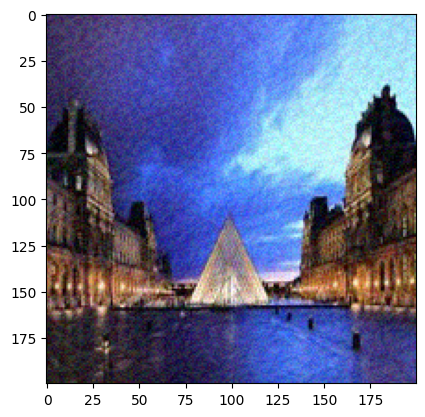

Style Loss: 111.874863 Content Loss: 0.00298346556 Total Loss: 4475.02441
Style Loss: 67.2049 Content Loss: 0.0058456366 Total Loss: 2688.25439
Style Loss: 63.7362213 Content Loss: 0.00898601767 Total Loss: 2549.53857
Style Loss: 56.8258629 Content Loss: 0.0108501688 Total Loss: 2273.14282
Style Loss: 46.7167892 Content Loss: 0.0118340403 Total Loss: 1868.78992
Style Loss: 39.1610794 Content Loss: 0.0123380106 Total Loss: 1566.56653
Style Loss: 34.9797935 Content Loss: 0.0125925904 Total Loss: 1399.31775
Style Loss: 33.1300087 Content Loss: 0.0127861938 Total Loss: 1325.32812
Style Loss: 31.8637619 Content Loss: 0.0130778113 Total Loss: 1274.68127
Style Loss: 29.8581219 Content Loss: 0.0134531679 Total Loss: 1194.45935
Style Loss: 27.1663246 Content Loss: 0.0138460891 Total Loss: 1086.79138
Style Loss: 24.3108616 Content Loss: 0.014200923 Total Loss: 972.576477
Style Loss: 21.4436855 Content Loss: 0.0144428443 Total Loss: 857.891846
Style Loss: 18.6682262 Content Loss: 0.0145194596 Tot

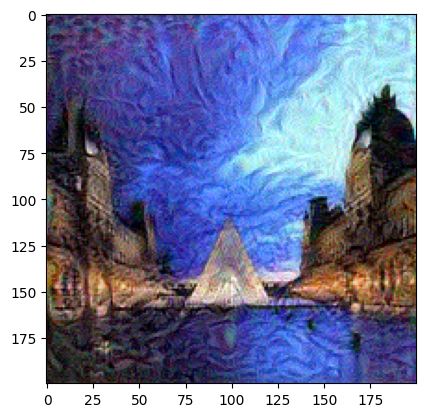

Style Loss: 3.55946684 Content Loss: 0.0206854884 Total Loss: 142.585526
Style Loss: 3.46697855 Content Loss: 0.0208071638 Total Loss: 138.887207
Style Loss: 3.38001418 Content Loss: 0.0209229533 Total Loss: 135.40979
Style Loss: 3.30738688 Content Loss: 0.0210233591 Total Loss: 132.505707
Style Loss: 3.24226665 Content Loss: 0.0211027302 Total Loss: 129.901703
Style Loss: 3.1719749 Content Loss: 0.021157857 Total Loss: 127.090576
Style Loss: 3.09966063 Content Loss: 0.0211969987 Total Loss: 124.198395
Style Loss: 3.04050136 Content Loss: 0.0212386679 Total Loss: 121.832443
Style Loss: 2.99429536 Content Loss: 0.0212981645 Total Loss: 119.984795
Style Loss: 2.94401789 Content Loss: 0.0213842019 Total Loss: 117.974556
Style Loss: 2.88199234 Content Loss: 0.021491196 Total Loss: 115.494606
Style Loss: 2.82005119 Content Loss: 0.0216027535 Total Loss: 113.018074
Style Loss: 2.76992154 Content Loss: 0.0217014104 Total Loss: 111.01387
Style Loss: 2.72903585 Content Loss: 0.021771878 Total L

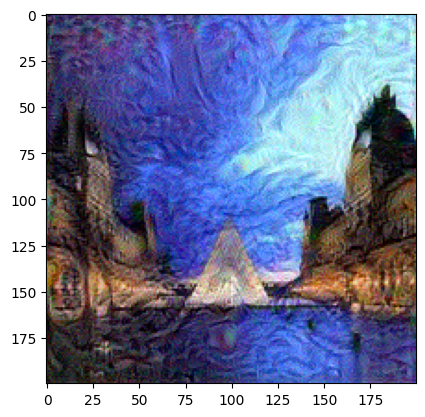

Style Loss: 1.74643683 Content Loss: 0.0229128134 Total Loss: 70.0866
Style Loss: 1.73136318 Content Loss: 0.0229310319 Total Loss: 69.4838333
Style Loss: 1.71676743 Content Loss: 0.0229478814 Total Loss: 68.900177
Style Loss: 1.70239222 Content Loss: 0.0229623988 Total Loss: 68.3253098
Style Loss: 1.68818295 Content Loss: 0.0229764786 Total Loss: 67.7570877
Style Loss: 1.67424023 Content Loss: 0.0229910016 Total Loss: 67.1995239
Style Loss: 1.6606524 Content Loss: 0.0230067633 Total Loss: 66.6561584
Style Loss: 1.64742017 Content Loss: 0.0230223108 Total Loss: 66.1270294
Style Loss: 1.63444662 Content Loss: 0.0230361726 Total Loss: 65.6082306
Style Loss: 1.62163568 Content Loss: 0.0230478402 Total Loss: 65.0959
Style Loss: 1.60902464 Content Loss: 0.0230573062 Total Loss: 64.5915604
Style Loss: 1.59670782 Content Loss: 0.0230665039 Total Loss: 64.0989761
Style Loss: 1.58468747 Content Loss: 0.0230758861 Total Loss: 63.6182556
Style Loss: 1.57294762 Content Loss: 0.0230856482 Total Los

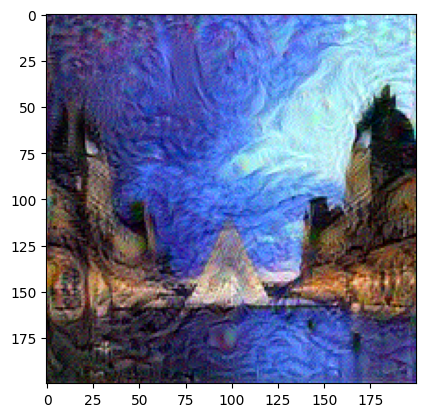

Style Loss: 1.24825454 Content Loss: 0.0232787728 Total Loss: 50.1629715
Style Loss: 1.24153697 Content Loss: 0.0232816637 Total Loss: 49.8942947
Style Loss: 1.23491025 Content Loss: 0.0232850555 Total Loss: 49.6292572
Style Loss: 1.22836161 Content Loss: 0.0232888293 Total Loss: 49.3673515
Style Loss: 1.22189951 Content Loss: 0.0232925154 Total Loss: 49.1089058
Style Loss: 1.21550977 Content Loss: 0.0232956745 Total Loss: 48.8533478
Style Loss: 1.20920825 Content Loss: 0.0232985392 Total Loss: 48.6013184
Style Loss: 1.20298 Content Loss: 0.0233013444 Total Loss: 48.3522148
Style Loss: 1.19682193 Content Loss: 0.0233046524 Total Loss: 48.1059265
Style Loss: 1.19073856 Content Loss: 0.0233080052 Total Loss: 47.8626251
Style Loss: 1.18472958 Content Loss: 0.0233106371 Total Loss: 47.6222878
Style Loss: 1.17880154 Content Loss: 0.0233128 Total Loss: 47.3851891
Style Loss: 1.17294693 Content Loss: 0.02331472 Total Loss: 47.1510239
Style Loss: 1.16714907 Content Loss: 0.023316903 Total Loss

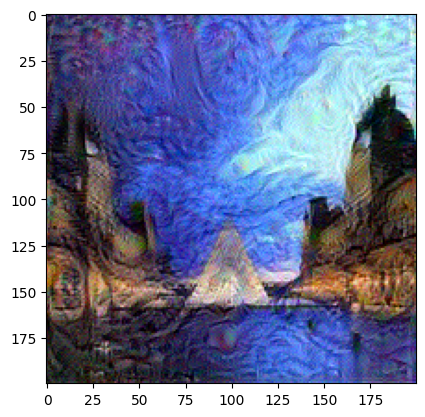

Style Loss: 0.991249382 Content Loss: 0.023404479 Total Loss: 39.8840179
Style Loss: 0.987378538 Content Loss: 0.0234080199 Total Loss: 39.7292213
Style Loss: 0.983552814 Content Loss: 0.0234114248 Total Loss: 39.5762291
Style Loss: 0.979760408 Content Loss: 0.0234147031 Total Loss: 39.4245605
Style Loss: 0.976002872 Content Loss: 0.0234182011 Total Loss: 39.2742958
Style Loss: 0.972276747 Content Loss: 0.0234219972 Total Loss: 39.1252899
Style Loss: 0.968582749 Content Loss: 0.0234260317 Total Loss: 38.9775696
Style Loss: 0.964922607 Content Loss: 0.0234298985 Total Loss: 38.8312035
Style Loss: 0.961298406 Content Loss: 0.0234340522 Total Loss: 38.6862755
Style Loss: 0.957708418 Content Loss: 0.0234383512 Total Loss: 38.5427208
Style Loss: 0.954151034 Content Loss: 0.0234426279 Total Loss: 38.4004669
Style Loss: 0.950624704 Content Loss: 0.0234468561 Total Loss: 38.2594566
Style Loss: 0.94713062 Content Loss: 0.0234506391 Total Loss: 38.1197281
Style Loss: 0.943669379 Content Loss: 0.

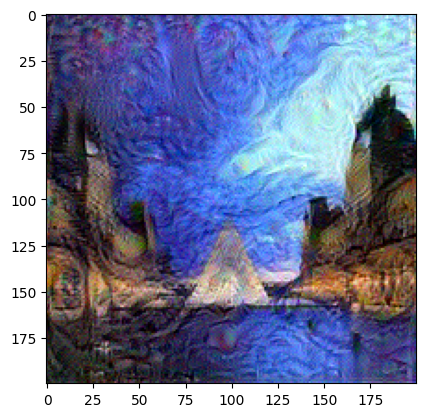

Style Loss: 0.835128725 Content Loss: 0.0235839747 Total Loss: 33.6409874
Style Loss: 0.832620144 Content Loss: 0.0235871933 Total Loss: 33.5406761
Style Loss: 0.830134213 Content Loss: 0.0235904697 Total Loss: 33.4412727
Style Loss: 0.827668309 Content Loss: 0.0235935841 Total Loss: 33.3426666
Style Loss: 0.825224638 Content Loss: 0.0235964563 Total Loss: 33.2449532
Style Loss: 0.82279706 Content Loss: 0.0235992726 Total Loss: 33.1478729
Style Loss: 0.820389271 Content Loss: 0.0236023404 Total Loss: 33.0515938
Style Loss: 0.81800133 Content Loss: 0.0236055795 Total Loss: 32.9561119
Style Loss: 0.815634847 Content Loss: 0.0236087702 Total Loss: 32.8614807
Style Loss: 0.813288569 Content Loss: 0.0236119926 Total Loss: 32.767662
Style Loss: 0.810962081 Content Loss: 0.0236153603 Total Loss: 32.6746368
Style Loss: 0.808653414 Content Loss: 0.0236188862 Total Loss: 32.582325
Style Loss: 0.806362 Content Loss: 0.0236225445 Total Loss: 32.4907036
Style Loss: 0.804086089 Content Loss: 0.02362

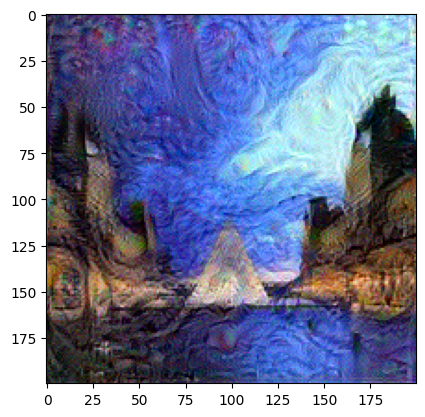

Style Loss: 0.729825854 Content Loss: 0.0237883516 Total Loss: 29.4309177
Style Loss: 0.728061259 Content Loss: 0.0237933397 Total Loss: 29.360384
Style Loss: 0.726310492 Content Loss: 0.023798354 Total Loss: 29.2904034
Style Loss: 0.724572718 Content Loss: 0.0238032695 Total Loss: 29.2209415
Style Loss: 0.722846687 Content Loss: 0.0238082111 Total Loss: 29.1519508
Style Loss: 0.721130431 Content Loss: 0.0238132123 Total Loss: 29.0833492
Style Loss: 0.719425321 Content Loss: 0.023818193 Total Loss: 29.0151939
Style Loss: 0.717730522 Content Loss: 0.0238230918 Total Loss: 28.9474525
Style Loss: 0.716044605 Content Loss: 0.0238279812 Total Loss: 28.880064
Style Loss: 0.71436727 Content Loss: 0.0238328837 Total Loss: 28.8130207
Style Loss: 0.712698758 Content Loss: 0.0238377936 Total Loss: 28.7463284
Style Loss: 0.711039066 Content Loss: 0.0238426235 Total Loss: 28.6799889
Style Loss: 0.709388673 Content Loss: 0.0238473415 Total Loss: 28.6140213
Style Loss: 0.707747817 Content Loss: 0.023

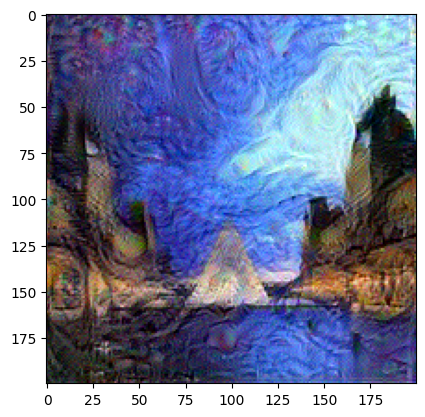

Style Loss: 0.652819395 Content Loss: 0.0240078326 Total Loss: 26.3528538
Style Loss: 0.651480734 Content Loss: 0.0240109954 Total Loss: 26.2993393
Style Loss: 0.650150418 Content Loss: 0.0240142029 Total Loss: 26.2461586
Style Loss: 0.648828208 Content Loss: 0.0240175035 Total Loss: 26.1933041
Style Loss: 0.64751327 Content Loss: 0.0240208767 Total Loss: 26.1407413
Style Loss: 0.646205068 Content Loss: 0.0240241382 Total Loss: 26.0884438
Style Loss: 0.644903541 Content Loss: 0.0240273383 Total Loss: 26.0364151
Style Loss: 0.643609524 Content Loss: 0.0240305457 Total Loss: 25.9846859
Style Loss: 0.642324209 Content Loss: 0.0240335856 Total Loss: 25.9333038
Style Loss: 0.641044617 Content Loss: 0.0240366012 Total Loss: 25.8821507
Style Loss: 0.639771461 Content Loss: 0.0240396094 Total Loss: 25.831255
Style Loss: 0.638506 Content Loss: 0.02404272 Total Loss: 25.7806664
Style Loss: 0.637247145 Content Loss: 0.024045825 Total Loss: 25.7303429
Style Loss: 0.635994554 Content Loss: 0.024048

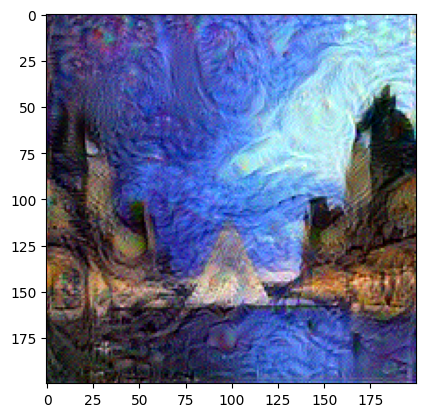

Style Loss: 0.593948126 Content Loss: 0.0241709985 Total Loss: 23.9996357
Style Loss: 0.592924953 Content Loss: 0.0241745021 Total Loss: 23.958744
Style Loss: 0.591907501 Content Loss: 0.0241780076 Total Loss: 23.9180794
Style Loss: 0.590896189 Content Loss: 0.0241813455 Total Loss: 23.8776608
Style Loss: 0.589889705 Content Loss: 0.0241846759 Total Loss: 23.8374348
Style Loss: 0.588887 Content Loss: 0.0241879486 Total Loss: 23.7973595
Style Loss: 0.587890446 Content Loss: 0.0241912547 Total Loss: 23.7575302
Style Loss: 0.586899221 Content Loss: 0.0241944864 Total Loss: 23.7179146
Style Loss: 0.585912943 Content Loss: 0.0241976585 Total Loss: 23.6784935
Style Loss: 0.58493 Content Loss: 0.0242008809 Total Loss: 23.6392078
Style Loss: 0.583952 Content Loss: 0.0242040325 Total Loss: 23.6001205
Style Loss: 0.582979679 Content Loss: 0.0242071599 Total Loss: 23.5612583
Style Loss: 0.582012475 Content Loss: 0.0242101457 Total Loss: 23.5226
Style Loss: 0.581050634 Content Loss: 0.0242131446 T

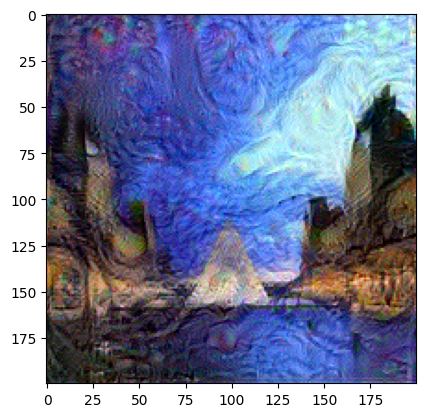

Style Loss: 0.548524201 Content Loss: 0.0243103225 Total Loss: 22.1840706
Style Loss: 0.547718704 Content Loss: 0.0243126899 Total Loss: 22.1518764
Style Loss: 0.546916 Content Loss: 0.0243149288 Total Loss: 22.1197891
Style Loss: 0.546117425 Content Loss: 0.0243170504 Total Loss: 22.0878658
Style Loss: 0.54532212 Content Loss: 0.0243192259 Total Loss: 22.056078
Style Loss: 0.544530392 Content Loss: 0.0243213847 Total Loss: 22.0244293
Style Loss: 0.543742478 Content Loss: 0.0243235696 Total Loss: 21.9929352
Style Loss: 0.54295814 Content Loss: 0.0243257843 Total Loss: 21.9615841
Style Loss: 0.542176545 Content Loss: 0.024328 Total Loss: 21.9303417
Style Loss: 0.54139936 Content Loss: 0.0243301932 Total Loss: 21.8992767
Style Loss: 0.540626884 Content Loss: 0.0243323911 Total Loss: 21.8684
Style Loss: 0.539857268 Content Loss: 0.0243345462 Total Loss: 21.8376369
Style Loss: 0.53908968 Content Loss: 0.0243367124 Total Loss: 21.8069534
Style Loss: 0.538325608 Content Loss: 0.0243388675 To

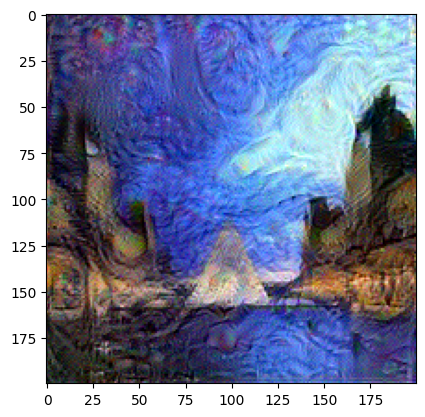

In [113]:
epochs = 501
for i in range(epochs):
    train_step(generated_image)
    if i % 50 == 0:
        print(f"Epoch {i} ")
    if i % 50 == 0:
        image = tensor_to_image(generated_image)
        imshow(image)
        image.save(f"image_{i}.jpg")
        plt.show()

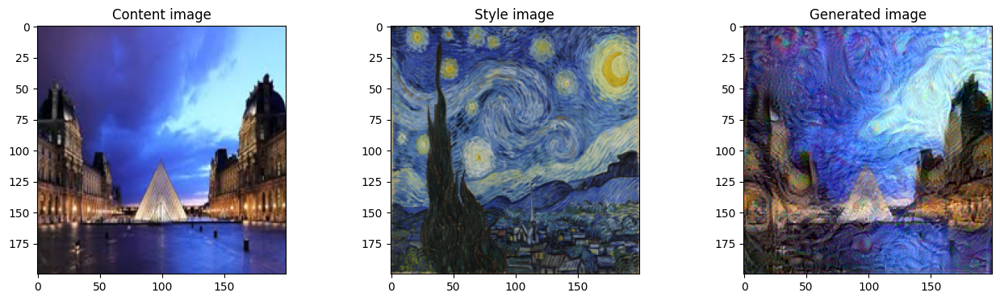

In [114]:
fig = plt.figure(figsize=(16, 4))
ax = fig.add_subplot(1, 3, 1)
imshow(content_image[0])
ax.title.set_text('Content image')
ax = fig.add_subplot(1, 3, 2)
imshow(style_image[0])
ax.title.set_text('Style image')
ax = fig.add_subplot(1, 3, 3)
imshow(generated_image[0])
ax.title.set_text('Generated image')
plt.show()